### Importing Data
Movie data was obtained from Kaggle's TMDB dataset (https://www.kaggle.com/tmdb/tmdb-movie-metadata). The data was cleaned with the `cleaned_data.py` script. The `import_clean_csv` method from the `import_data.py` module is used to import the cleaned TMDB data

In [14]:
import os
import glob
import importlib.util
import pandas as pd
import datetime as dt
from functools import reduce
import numpy as np
import sys
from scipy import stats
from tqdm import tqdm_notebook as tqdm
from tqdm import tqdm_pandas
tqdm().pandas()

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

In [2]:
%load_ext autoreload
%autoreload 2

current_file_path = os.path.abspath(os.path.join("__file__" ,"../.."))
tools_path = os.path.abspath(os.path.join(current_file_path, 'src', 'tools'))
sys.path.append(os.path.abspath(os.path.join(tools_path)))
import thinkstats2, thinkplot
from data_vis import get_plotly
import eda_tools as eda

import_data_path = os.path.join(current_file_path,'src','data')

spec = importlib.util.spec_from_file_location("import_clean_csv", os.path.join(import_data_path,"import_clean_data.py"))
import_data = importlib.util.module_from_spec(spec)
spec.loader.exec_module(import_data)

data = import_data.import_clean_csv()

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

### Importing Packages for Visualizations

In [3]:
#Following Python packages are necessary for data visualiations below

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import cufflinks as cf

init_notebook_mode(connected=True)
cf.go_offline()

# Read in csv Files

In [4]:
# create dataframes from cleaned data
movies = data['tmdb_movie_main'].set_index(['movie_id', 'title'])
movies['release_date'] = pd.to_datetime(movies['release_date'])
movies.drop('tagline', axis=1, inplace=True)

movies['net'] = movies.revenue - movies.budget
movies['net_pct'] = movies.revenue.divide(movies.budget) - 1
movies['target'] = movies['net'].apply(lambda x: 1 if x > 0 else 0)
movies.tail(2)

,,budget,original_language,overview,popularity,release_date,revenue,runtime,status,vote_average,vote_count,net,net_pct,target
movie_id,title,,,,,,,,,,,,,
72766,Newlyweds,9000,en,A newlywed couple's honeymoon is upended by th...,0.642552,2011-12-26,4584,85,Released,5.9,5,-4416,-0.490667,0
25975,My Date with Drew,1100,en,Ever since the second grade when he first saw ...,1.929883,2005-08-05,181041,90,Released,6.3,16,179941,163.582727,1


In [5]:
files = glob.glob("*.csv")
print(files)

['Actor_credits.csv', 'Director_credits.csv', 'Executive_Producer_credits.csv', 'Writer_credits.csv']


In [6]:
other_data_dfs = {}
for file in ['Actor_credits.csv', 'Director_credits.csv']:
    key = file.split('.')[0].lower()
    prefix = key.split('_')[0]
    other_data_dfs[key] = \
        pd.read_csv(file).set_index(['movie_id','title']).rename(
                                                                columns={
                                                                    'name': prefix + '_name', 
                                                                     'credits': prefix + '_credits', 
                                                                     'net_to_date': prefix + '_net_to_date'
                                                                    }
                                                                )

In [7]:
combined_other_data = reduce(lambda left,right: pd.merge(left,right,left_index=True, right_index=True, how='outer'), [i for _, i in other_data_dfs.items()])

In [8]:
len(combined_other_data)

4342

In [9]:
total_df = pd.merge(movies, combined_other_data, left_index=True, right_index=True, how='outer')

In [10]:
total_df[total_df.isnull().any(axis=1)]

,,budget,original_language,overview,popularity,release_date,revenue,runtime,status,vote_average,vote_count,net,net_pct,target,actor_name,actor_credits,actor_net_to_date,director_name,director_credits,director_net_to_date
movie_id,title,,,,,,,,,,,,,,,,,,,
9396,Crocodile Dundee 2,14000000,en,Australian outback expert protects his New Yor...,15.474831,1988-05-19,239606210,110,Released,5.5,303,225606210,16.114729,1,NaN,NaN,NaN,NaN,NaN,NaN
9644,Loaded Weapon 1,13000000,en,An LA detective is murdered because she has mi...,12.963328,1993-02-04,27979399,84,Released,5.7,157,14979399,1.152261,1,NaN,NaN,NaN,NaN,NaN,NaN
11658,Tae Guik Gi: The Brotherhood of War,12500000,ko,"In 1950, in South Korea, shoe-shiner Jin-tae L...",9.572705,2004-02-05,69826708,140,Released,7.4,133,57326708,4.586137,1,NaN,NaN,NaN,NaN,NaN,NaN
12154,3 Men and a Baby,15000000,es,Three bachelors find themselves forced to take...,12.335827,1987-11-27,167780960,102,Released,5.8,253,152780960,10.185397,1,NaN,NaN,NaN,NaN,NaN,NaN
14358,Mad Hot Ballroom,500000,en,Eleven-year-old New York City public school ki...,0.772668,2005-05-13,9387581,105,Released,7.2,8,8887581,17.775162,1,NaN,NaN,NaN,Marilyn Agrelo,0.0,0.0
17644,Barney's Great Adventure,15000000,en,"Mom and dad dump son Cody, daughter Abby, her ...",0.722911,1998-01-01,11156471,76,Released,2.9,8,-3843529,-0.256235,0,NaN,NaN,NaN,Steve Gomer,0.0,0.0
19615,Flying By,5000000,en,A real estate developer goes to his 25th high ...,1.546169,2009-01-01,4568257,95,Released,7.0,2,-431743,-0.086349,0,Billy Ray Cyrus,0.0,0.0,NaN,NaN,NaN
20653,Roadside Romeo,7000000,en,This is the story of Romeo. A dude who was liv...,0.253595,2008-10-24,1100000,93,Released,6.7,3,-5900000,-0.842857,0,Saif Ali Khan,1.0,2043864.0,NaN,NaN,NaN
25353,La véritable histoire du Chat Botté,25000000,fr,A free adaptation of Charles Perrault's famous...,1.684948,2009-04-01,8208594,82,Released,3.8,7,-16791406,-0.671656,0,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
final_df = total_df.dropna()

In [24]:
final_df['release_day'] = final_df.release_date.dt.day
final_df['release_month'] = final_df.release_date.dt.month
final_df['release_year'] = final_df.release_date.dt.year

c:\users\illwil~1\virtua~1\capsto~1\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

c:\users\illwil~1\virtua~1\capsto~1\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

c:\users\illwil~1\virtua~1\capsto~1\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pand

In [25]:
keycols = ['budget', 'runtime', 'actor_credits', 'actor_net_to_date', 'director_credits', 'director_net_to_date', 'release_day', 'release_month', 'release_year', 'target']
final_df = final_df[keycols]
final_df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 4324 entries, (5, Four Rooms) to (426469, Growing Up Smith)
Data columns (total 10 columns):
budget                  4324 non-null int64
runtime                 4324 non-null int64
actor_credits           4324 non-null float64
actor_net_to_date       4324 non-null float64
director_credits        4324 non-null float64
director_net_to_date    4324 non-null float64
release_day             4324 non-null int64
release_month           4324 non-null int64
release_year            4324 non-null int64
target                  4324 non-null int64
dtypes: float64(4), int64(6)
memory usage: 405.8+ KB


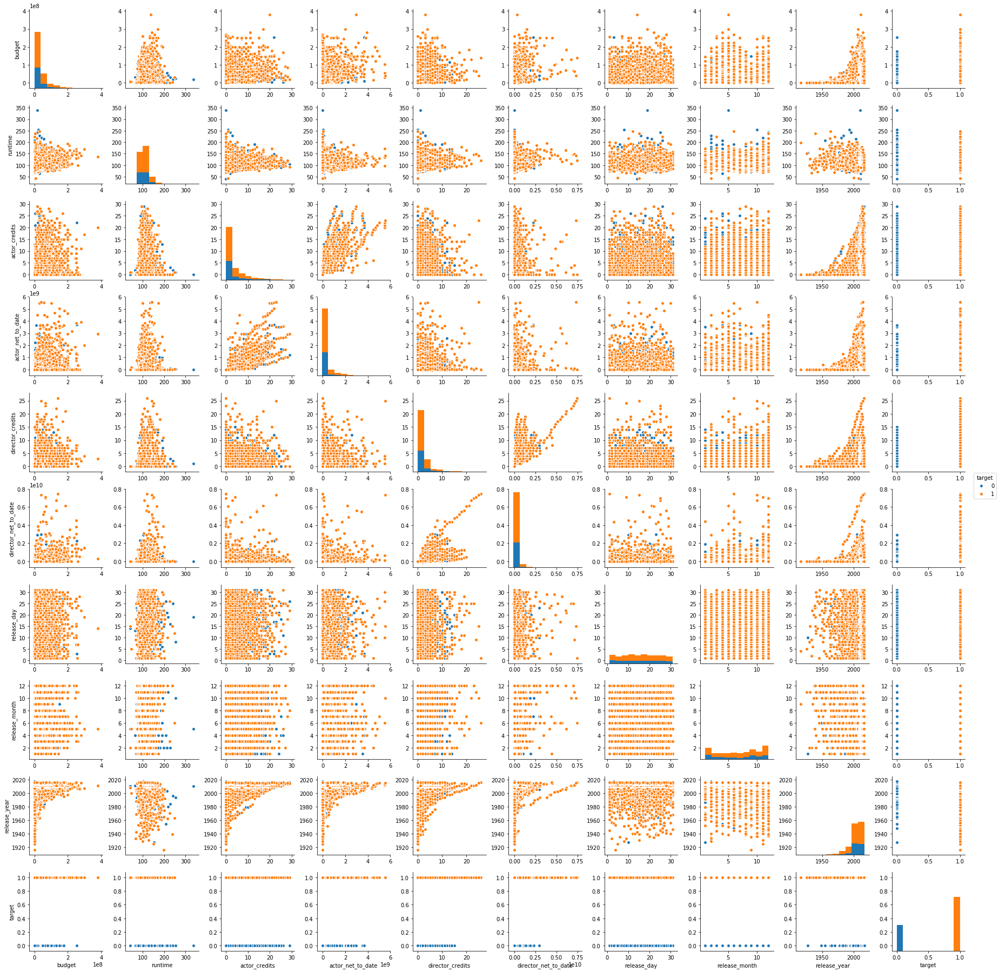

In [26]:
sns.pairplot(final_df, hue='target')